In [2]:
import os
import sys
import matplotlib.pyplot as plt

sys.path.append("../")

In [3]:
import graspologic as gr
from graspologic import layouts
import numpy as np
import pandas as pd
import networkx as nx
from graph import GraphIO
from apriori_sbm_code import generate_bic

## Ciona Intestinalis Larval Connectome ##

A very detailed connectome create via careful EM imaging of a the ascidian tadpole larva. Multiple hermaphroditic individuals were imaged. The original study was looking for topological asymetries between hemispheres in Ciona's CNS. The connectome includes mostly CNS Neurons. 

_Ryan, K., Lu, Z., & Meinertzhagen, I. A. (2016). The CNS connectome of a tadpole larva of Ciona intestinalis (L.) highlights sidedness in the brain of a chordate sibling. ELife, 5. doi:10.7554/elife.16962_

In [11]:
path = '../json_connectomes/ciona.json'
connectome, _, _, _ = GraphIO.load(path)

Now we generate a 2-dimmensional node layout using Graspologic's `layout_tnse`. This function creates a layout that shows
the community structure of the data.

In [6]:
undirected_connectome = nx.convert_node_labels_to_integers(connectome.to_undirected())
undirected_connectome, layout = gr.layouts.layout_tsne(undirected_connectome, perplexity=20, n_iter=1000000)

Next we must assign a color to the nodes in the graph. Here we base the colors on node "Side" attributes. Left is Blue,
Right is Red, and Medial is Purple. Nodes without a side attribute are grey.

In [8]:

color_map = {}
side_map = {'L': '#FF0000', 'DL': '#B22222', 'VL': '#F08080',
            'R': '#0000FF', 'DR': '#00008B', 'VR': '#87CEEB',
            'DM': '#800080', 'D': '#800080', 'VM': '#BA55D3',
            None: '#A9A9A9'}

for node in undirected_connectome.nodes(data=True):
    try:
        side = node[1]['Side'].strip()
    except KeyError:
        side = None
    color_map[node[0]] = side_map[side]

Now we will show the generated and colored layout

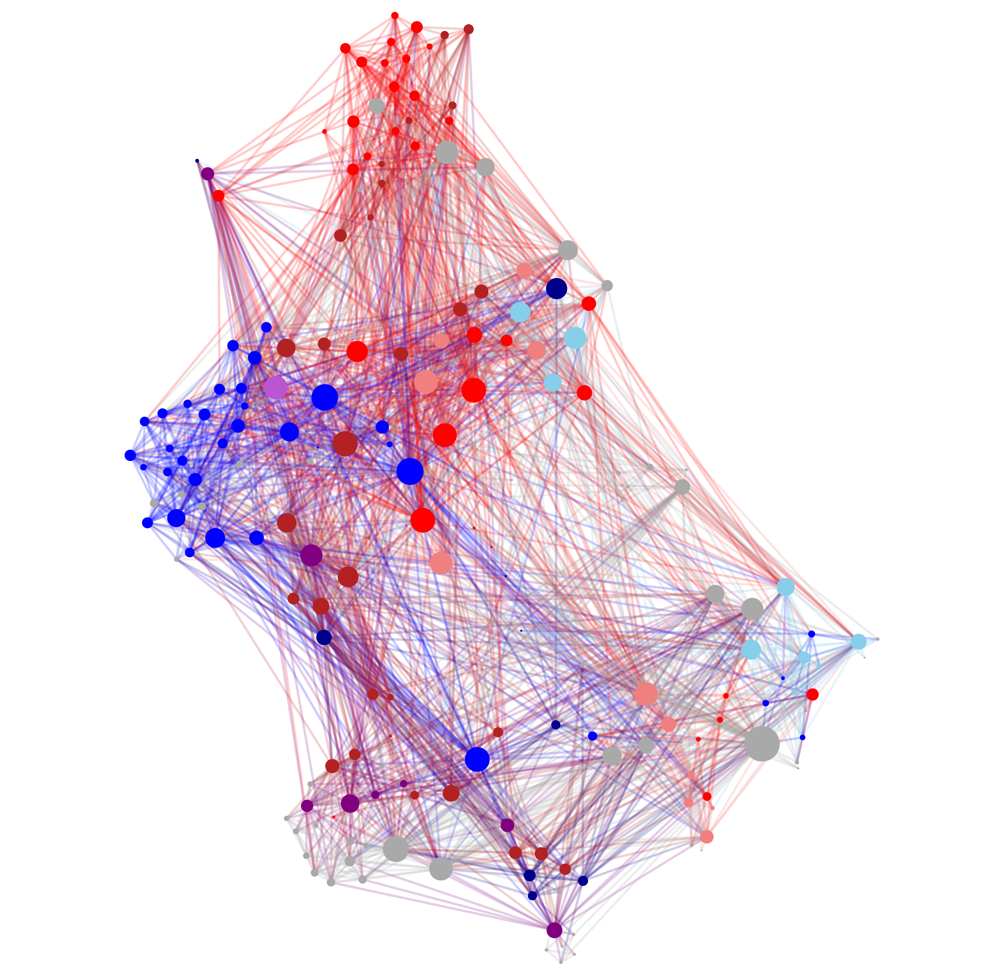

In [10]:
gr.layouts.show_graph(undirected_connectome, layout, color_map, vertex_shape='.', vertex_alpha=1., edge_alpha=.2, edge_line_width=2.)

Now lets display some basic graph statistics:

In [13]:
data = {'Number of Nodes': [],
        'Number of Edges': [],
        'Density': [],
        'Max Out Degree': [],
        'Max In Degree': []}
import pandas as pd
num_nodes = len(connectome.nodes)
data['Number of Nodes'].append(num_nodes)
num_edges = len(connectome.edges)
data['Number of Edges'].append(num_edges)
data['Density'].append(num_edges / (num_nodes * (num_nodes - 1)))
data['Max Out Degree'].append(max(connectome.out_degree, key=lambda x: x[1])[1])
data['Max In Degree'].append(max(connectome.in_degree, key=lambda x: x[1])[1])
df = pd.DataFrame.from_dict(data)
df.index = ['Ciona Intestinalis',]
df.head()

,Number of Nodes,Number of Edges,Density,Max Out Degree,Max In Degree
Ciona Intestinalis,222,3122,0.063634,46,78


## C. Elegens: Connectomes Over Development##

This dataset seeks to elucidate how connectomes change over development. Eight different EM connectomes were constructed
from C. Elegens Hermaphrodites at evenly spaced time intervals from birth until adulthood.

_Witvliet, D., Mulcahy, B., Mitchell, J. K., Meirovitch, Y., Berger, D. R., Wu, Y., . . . Zhen, M. (2020). Connectomes across development reveal principles of brain maturation in C. elegans. BioRxiv Preprint. doi:10.1101/2020.04.30.066209_